# Data preprocessing and exploration

## Importing libraries and dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
dataset = pd.read_csv('50_Startups.csv')
dataset.head(8)

,R&D Spend,Administration,Marketing Spend,State,Profit
0,165349.20,136897.80,471784.10,New York,192261.83
1,162597.70,151377.59,443898.53,California,191792.06
2,153441.51,101145.55,407934.54,Florida,191050.39
3,144372.41,118671.85,383199.62,New York,182901.99
4,142107.34,91391.77,366168.42,Florida,166187.94
5,131876.90,99814.71,362861.36,New York,156991.12
6,134615.46,147198.87,127716.82,California,156122.51
7,130298.13,145530.06,323876.68,Florida,155752.60


In [3]:
dataset.shape

(50, 5)

## Statistical description

In [85]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
R&D Spend,50.0,73721.6156,45902.256482,0.00,39936.3700,73051.080,101602.8000,165349.20
Administration,50.0,121344.6396,28017.802755,51283.14,103730.8750,122699.795,144842.1800,182645.56
Marketing Spend,50.0,211025.0978,122290.310726,0.00,129300.1325,212716.240,299469.0850,471784.10
Profit,50.0,112012.6392,40306.180338,14681.40,90138.9025,107978.190,139765.9775,192261.83


In [86]:
dataset[dataset['R&D Spend'] == 0.0]

,R&D Spend,Administration,Marketing Spend,State,Profit
47,0.0,135426.92,0.00,California,42559.73
49,0.0,116983.80,45173.06,California,14681.40


Recall some basics statistical functions
$$mean:=m=\frac{1}{n}\sum_{i=1}^nx_i,\;variance:=var=\frac{1}{n}\sum_{i=1}^n\left(x_i-m\right)^2,\;ecart\_type:=std=\sqrt{var}$$

In [87]:
dataset.describe(include='object')

,State
count,50
unique,3
top,New York
freq,17


In [7]:
dataset.State.value_counts()

State
New York      17
California    17
Florida       16
Name: count, dtype: int64

## Data exploration

In [8]:
import seaborn as sns
sns.set(style="whitegrid")

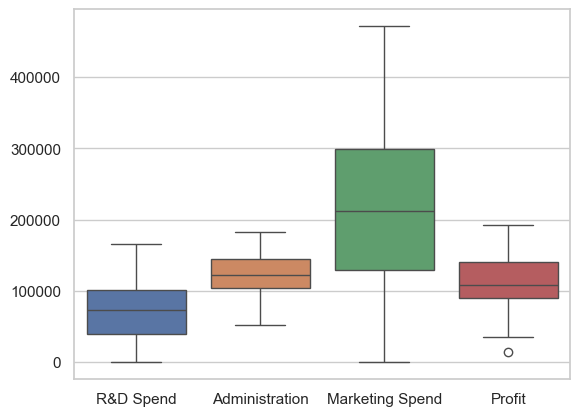

In [9]:
ax = sns.boxplot(data=dataset, orient="v")

In [10]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   R&D Spend        50 non-null     float64
 1   Administration   50 non-null     float64
 2   Marketing Spend  50 non-null     float64
 3   State            50 non-null     object 
 4   Profit           50 non-null     float64
dtypes: float64(4), object(1)
memory usage: 2.1+ KB


In [11]:
import seaborn as sns
sns.set(style="ticks")

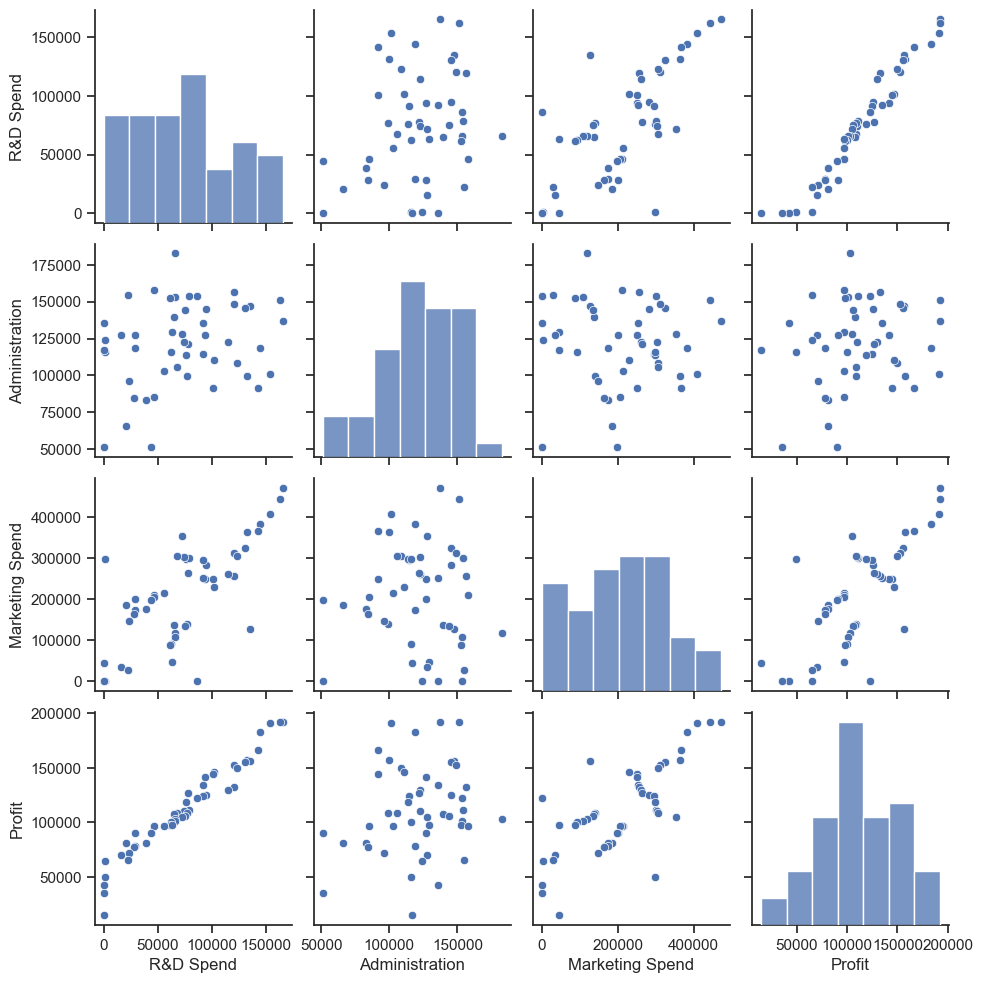

In [12]:
sns.pairplot(dataset)

Recall the covariance and the Pearson correlation coefficient
$$cov(x,y) = \frac{1}{n}\sum_{i=1}^n\left(x_i-mean_i\right)\left(y_j-mean_j\right), \quad pearson := \rho_{x,y} = \dfrac{cov(x,y)}{std_x std_y}$$

In [13]:
dataset.columns.to_list()

['R&D Spend', 'Administration', 'Marketing Spend', 'State', 'Profit']

In [14]:
features = ['R&D Spend', 'Administration', 'Marketing Spend', 'Profit']

In [15]:
correlations = dataset[features].corr(method='pearson')

<Axes: >

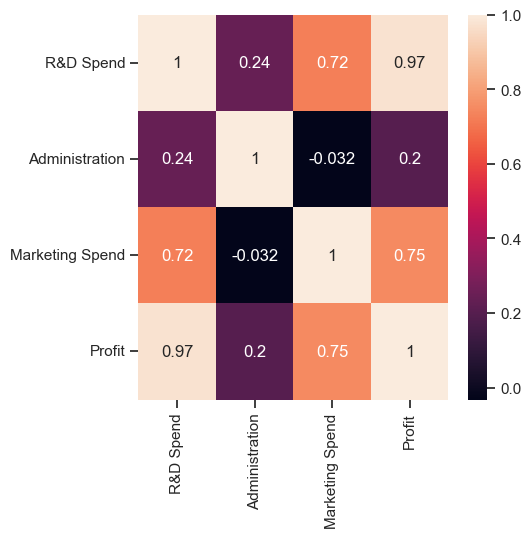

In [16]:
f, ax = plt.subplots(figsize = (5, 5))
sns.heatmap(correlations, annot = True)

## Data preprocessing

In [17]:
X = dataset.iloc[:,0:4].values
y = dataset.iloc[:,4].values

In [18]:
y.shape

(50,)

In [19]:
from sklearn.preprocessing import LabelEncoder
labelencoder_X = LabelEncoder()
X[:,3] = labelencoder_X.fit_transform(X[:,3])


In [20]:
X[0:5,0:4]

array([[165349.2, 136897.8, 471784.1, 2],
       [162597.7, 151377.59, 443898.53, 0],
       [153441.51, 101145.55, 407934.54, 1],
       [144372.41, 118671.85, 383199.62, 2],
       [142107.34, 91391.77, 366168.42, 1]], dtype=object)

In [21]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
ct = ColumnTransformer([("State", OneHotEncoder(), [3])], remainder = 'passthrough')
X = ct.fit_transform(X)
X = X.astype('float64')
X[0:5,:]


array([[0.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.6534920e+05,
        1.3689780e+05, 4.7178410e+05],
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.6259770e+05,
        1.5137759e+05, 4.4389853e+05],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.5344151e+05,
        1.0114555e+05, 4.0793454e+05],
       [0.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.4437241e+05,
        1.1867185e+05, 3.8319962e+05],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.4210734e+05,
        9.1391770e+04, 3.6616842e+05]])

In [22]:
X.shape

(50, 6)

In [23]:
X[0:5,:]

array([[0.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.6534920e+05,
        1.3689780e+05, 4.7178410e+05],
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.6259770e+05,
        1.5137759e+05, 4.4389853e+05],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.5344151e+05,
        1.0114555e+05, 4.0793454e+05],
       [0.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.4437241e+05,
        1.1867185e+05, 3.8319962e+05],
       [0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.4210734e+05,
        9.1391770e+04, 3.6616842e+05]])

In [24]:
# Avoid the trap of the Dummy variable
X = X[:,1:]
X.shape

(50, 5)

In [25]:
X[0:5,:]

array([[0.0000000e+00, 1.0000000e+00, 1.6534920e+05, 1.3689780e+05,
        4.7178410e+05],
       [0.0000000e+00, 0.0000000e+00, 1.6259770e+05, 1.5137759e+05,
        4.4389853e+05],
       [1.0000000e+00, 0.0000000e+00, 1.5344151e+05, 1.0114555e+05,
        4.0793454e+05],
       [0.0000000e+00, 1.0000000e+00, 1.4437241e+05, 1.1867185e+05,
        3.8319962e+05],
       [1.0000000e+00, 0.0000000e+00, 1.4210734e+05, 9.1391770e+04,
        3.6616842e+05]])

In [26]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)
X_test.shape

(10, 5)

# Data modeling 

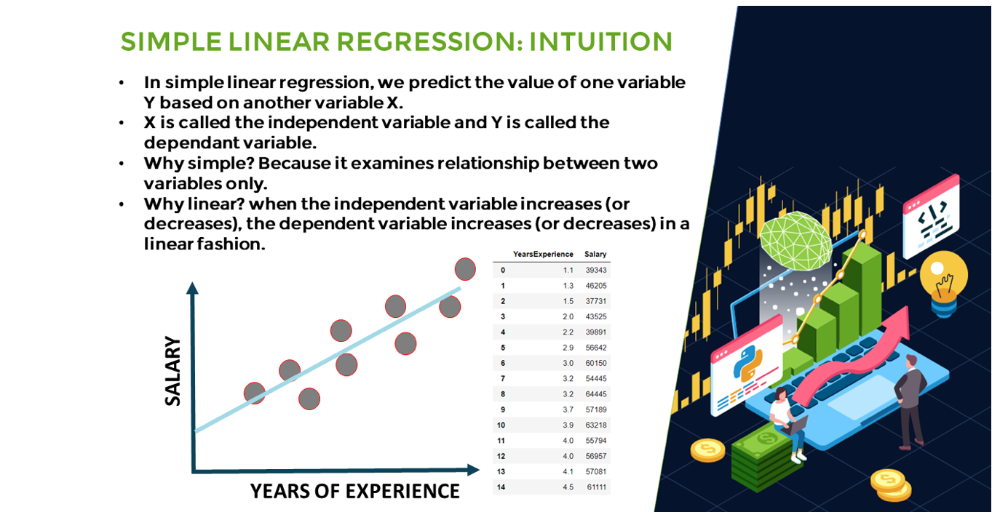

In [27]:
from IPython.display import display, Image
Image(filename='regression1.png')

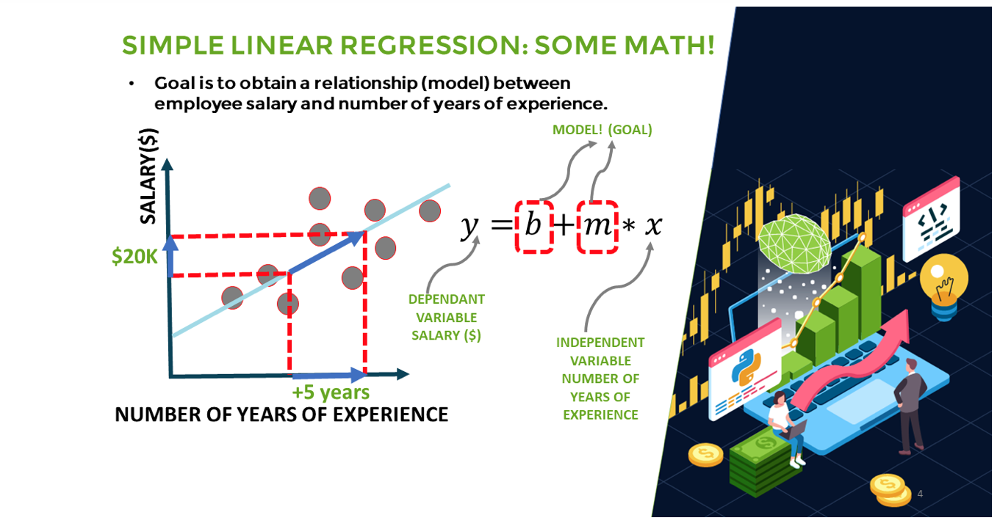

In [28]:
Image(filename='regression2.png')

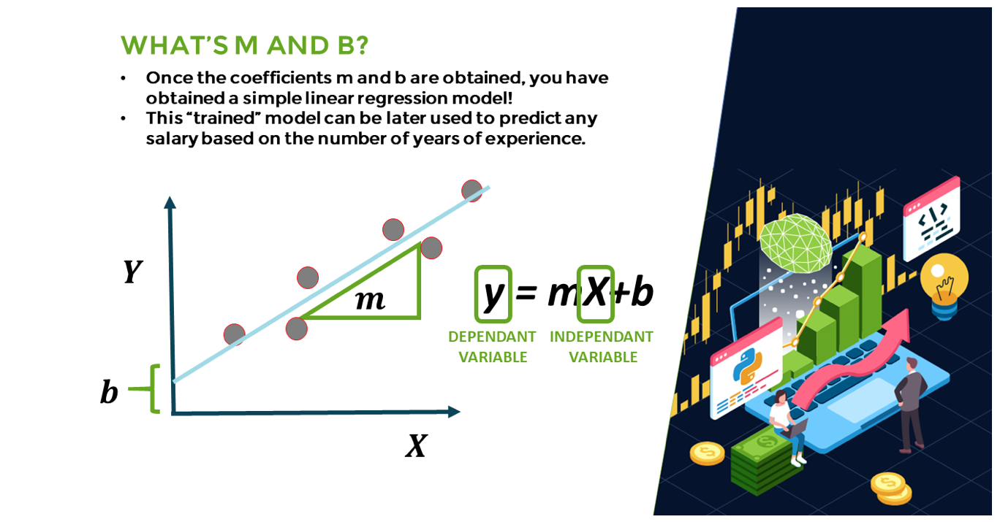

In [29]:
Image(filename='regression3.png')

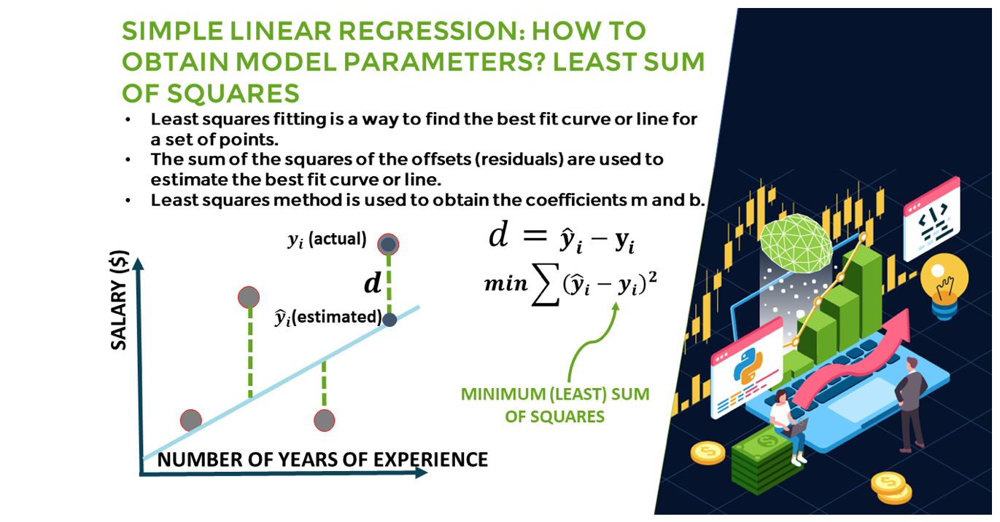

In [30]:
Image(filename='regression4.png')

## Fitting Multiple linear regression to the training set

In [31]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train,y_train)

LinearRegression()

In [32]:
print(f'b = {regressor.intercept_}')
print(f'm_i = {regressor.coef_}')

b = 42554.167617736515
m_i = [-9.59284160e+02  6.99369053e+02  7.73467193e-01  3.28845975e-02
  3.66100259e-02]


## Predicting the test set results

In [33]:
y_pred = regressor.predict(X_test)

In [34]:
X_test

array([[1.0000000e+00, 0.0000000e+00, 6.6051520e+04, 1.8264556e+05,
        1.1814820e+05],
       [0.0000000e+00, 0.0000000e+00, 1.0067196e+05, 9.1790610e+04,
        2.4974455e+05],
       [1.0000000e+00, 0.0000000e+00, 1.0191308e+05, 1.1059411e+05,
        2.2916095e+05],
       [1.0000000e+00, 0.0000000e+00, 2.7892920e+04, 8.4710770e+04,
        1.6447071e+05],
       [1.0000000e+00, 0.0000000e+00, 1.5344151e+05, 1.0114555e+05,
        4.0793454e+05],
       [0.0000000e+00, 1.0000000e+00, 7.2107600e+04, 1.2786455e+05,
        3.5318381e+05],
       [0.0000000e+00, 1.0000000e+00, 2.0229590e+04, 6.5947930e+04,
        1.8526510e+05],
       [0.0000000e+00, 1.0000000e+00, 6.1136380e+04, 1.5270192e+05,
        8.8218230e+04],
       [1.0000000e+00, 0.0000000e+00, 7.3994560e+04, 1.2278275e+05,
        3.0331926e+05],
       [1.0000000e+00, 0.0000000e+00, 1.4210734e+05, 9.1391770e+04,
        3.6616842e+05]])

In [35]:
for i in range(10):
    print([y_test[i],y_pred[i]])

[103282.38, 103015.201597967]
[144259.4, 132582.27760815158]
[146121.95, 132447.7384517456]
[77798.83, 71976.09851258327]
[191050.39, 178537.4822105455]
[105008.31, 116161.2423016477]
[81229.06, 67851.69209675798]
[97483.56, 98791.7337468782]
[110352.25, 113969.43533012434]
[166187.94, 167921.06569550032]


## Mean Squared Error, Mean Absolute Error, RMSE and R squared

In [36]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [37]:
def rmse(targets, predictions): 
    return np.sqrt(((predictions - targets) ** 2).mean())

In [38]:
print(f'MSE = {mean_squared_error(y_test, y_pred)}')
print(f'RMSE = {rmse(y_test, y_pred)}')
print(f'MAE = {mean_absolute_error(y_test, y_pred)}')
print(f'R2 = {r2_score(y_test,y_pred)}')

MSE = 83502864.03257987
RMSE = 9137.99015279508
MAE = 7514.293659639967
R2 = 0.9347068473282405


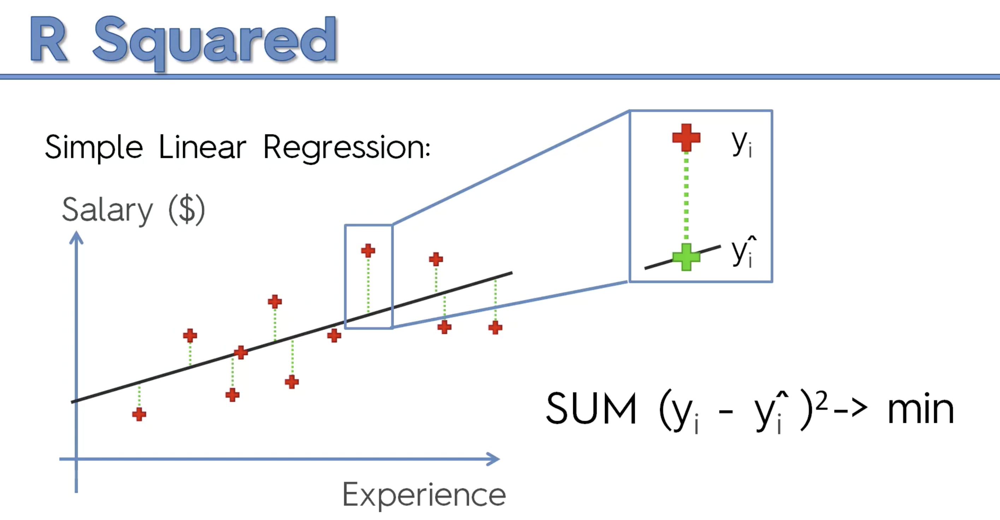

In [39]:
Image(filename='RSq1.png')

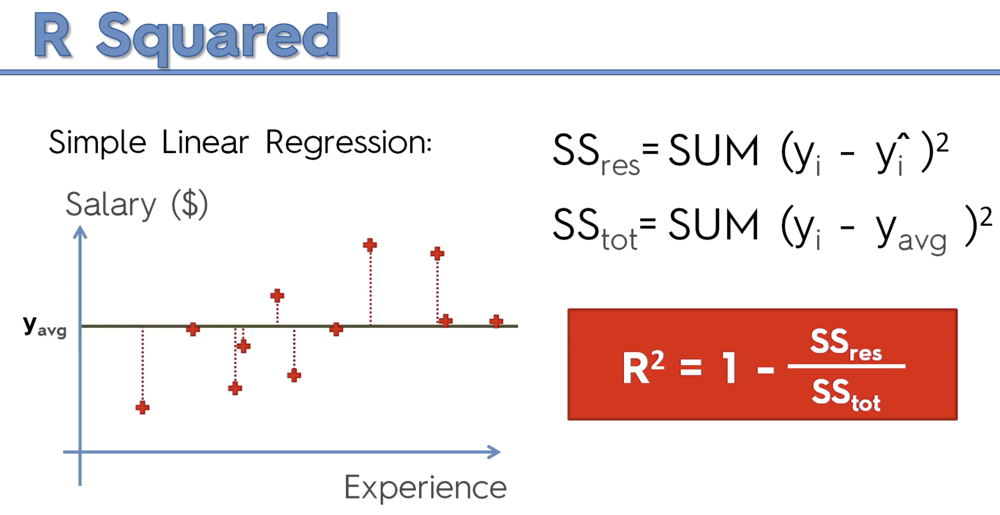

In [40]:
Image(filename='RSq2.png')

In [41]:
from sklearn.neighbors import KNeighborsRegressor

In [42]:
knn = KNeighborsRegressor()
knn.fit(X_train,y_train)

KNeighborsRegressor()

In [43]:
y_pred_knn = knn.predict(X_test)

In [44]:
for i in range(10):
    print([y_test[i],y_pred_knn[i]])

[103282.38, 114040.524]
[144259.4, 131413.948]
[146121.95, 125916.352]
[77798.83, 83434.562]
[191050.39, 175939.91999999998]
[105008.31, 123955.812]
[81229.06, 83434.56199999999]
[97483.56, 102301.59]
[110352.25, 117631.66200000001]
[166187.94, 159523.48799999998]


In [45]:
print(f'MSE = {mean_squared_error(y_test, y_pred_knn)}')
print(f'RMSE = {rmse(y_test, y_pred_knn)}')
print(f'MAE = {mean_absolute_error(y_test, y_pred_knn)}')
print(f'R2 = {r2_score(y_test,y_pred_knn)}')

MSE = 143358751.24623257
RMSE = 11973.251490143877
MAE = 10447.029400000007
R2 = 0.8879039067653898


In [46]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(X_train,y_train)

DecisionTreeRegressor()

In [47]:
y_pred_dt = dt.predict(X_test)

In [48]:
for i in range(10):
    print([y_test[i],y_pred_dt[i]])

[103282.38, 101004.64]
[144259.4, 141585.52]
[146121.95, 141585.52]
[77798.83, 78239.91]
[191050.39, 182901.99]
[105008.31, 108733.99]
[81229.06, 71498.49]
[97483.56, 99937.59]
[110352.25, 108733.99]
[166187.94, 155752.6]


In [49]:
print(f'MSE = {mean_squared_error(y_test, y_pred_dt)}')
print(f'RMSE = {rmse(y_test, y_pred_dt)}')
print(f'MAE = {mean_absolute_error(y_test, y_pred_dt)}')
print(f'R2 = {r2_score(y_test,y_pred_dt)}')

MSE = 32560993.860470045
RMSE = 5706.224133388912
MAE = 4604.141000000005
R2 = 0.9745396763583295


# Ridge (L2) Regularization 

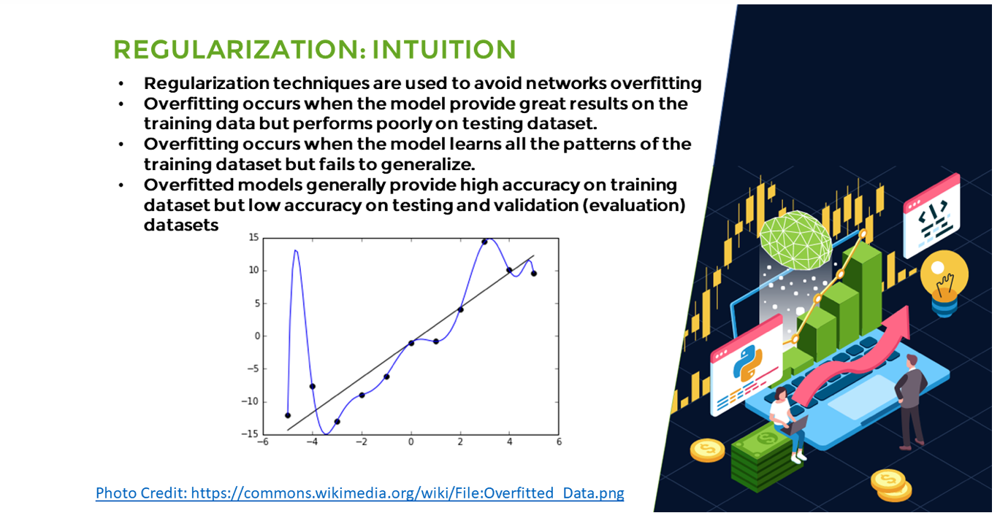

In [50]:
Image(filename='regularization1.png')

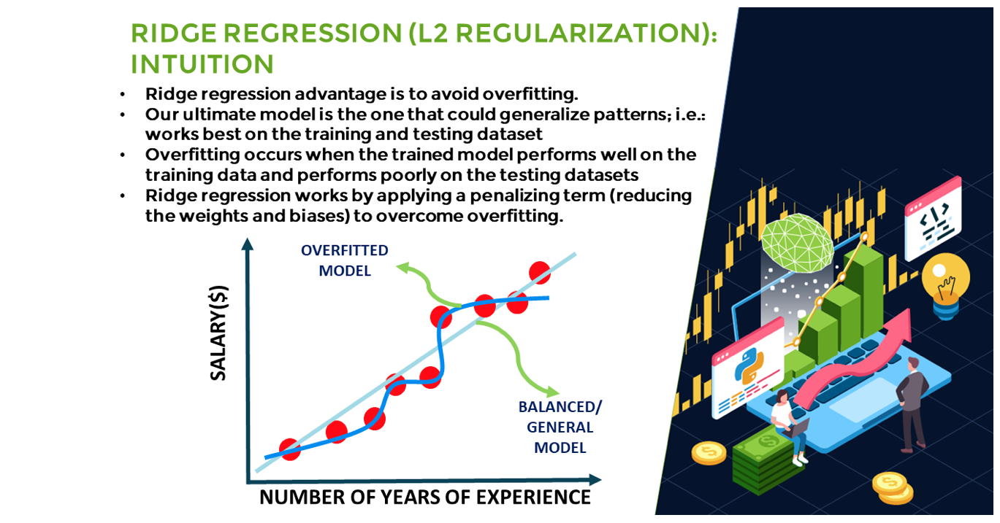

In [51]:
Image(filename='regularization2.png')

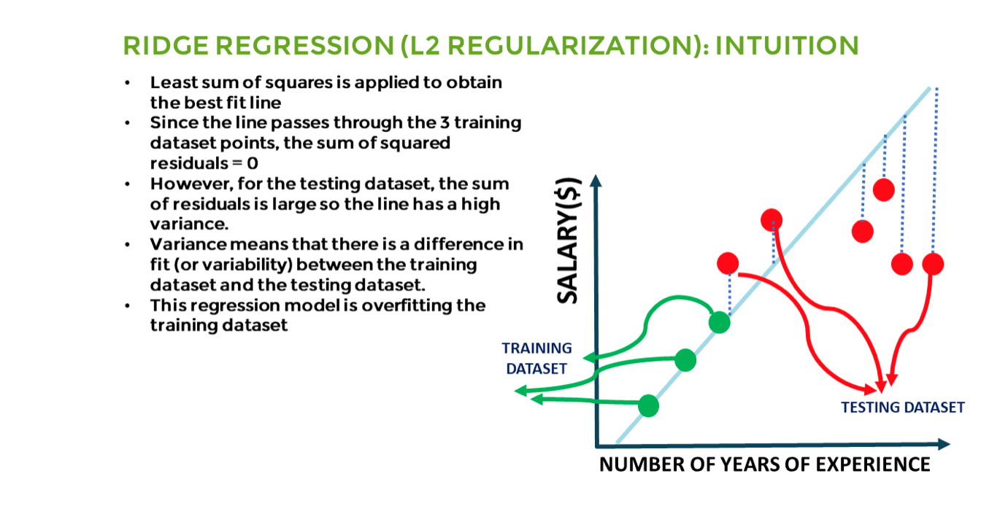

In [52]:
Image(filename='regularization3.png')

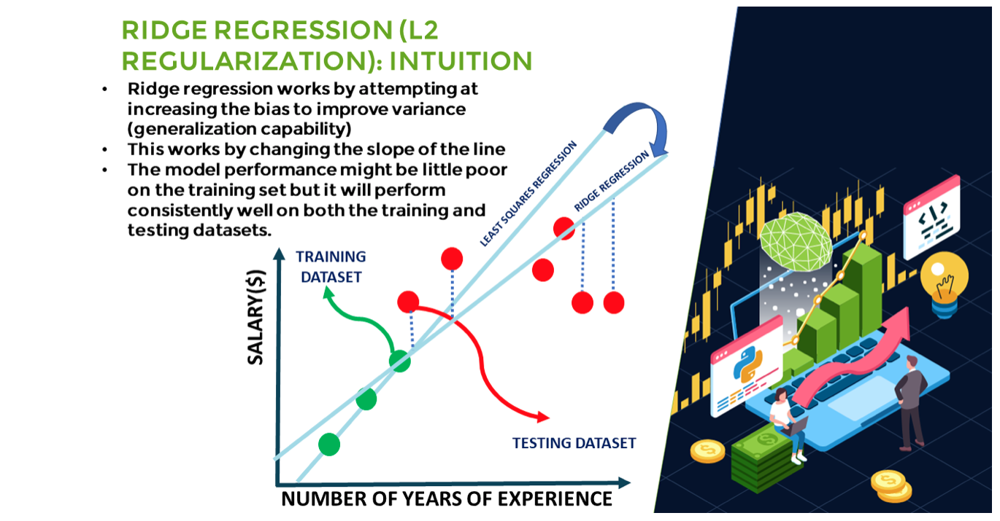

In [53]:
Image(filename='regularization4.png')

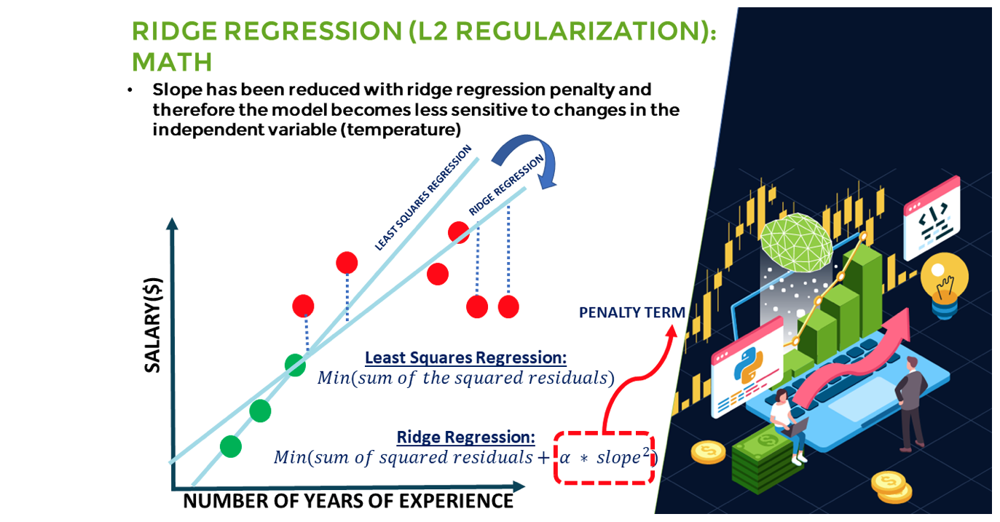

In [54]:
Image(filename='regularization5.png')

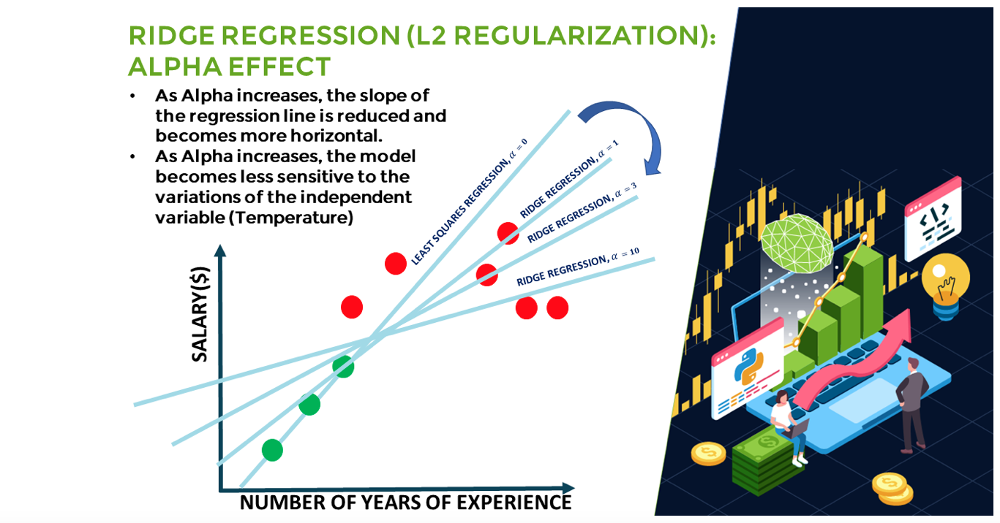

In [55]:
Image(filename='regularization6.png')

In [56]:
from sklearn.linear_model import Ridge
ridge = Ridge()
ridge.fit(X_train, y_train)

Ridge()

In [57]:
print(ridge.intercept_)
print(ridge.coef_)

42580.967043520825
[-8.55246577e+02  6.60540602e+02  7.73903697e-01  3.25917542e-02
  3.64400165e-02]


In [58]:
y_pred_r = ridge.predict(X_test)

In [59]:
for i in range(10):
    print([y_test[i],y_pred_r[i]])

[103282.38, 103101.29753165526]
[144259.4, 132583.68158636743]
[146121.95, 132551.71469029196]
[77798.83, 72066.34235581028]
[191050.39, 178636.32459231315]
[105008.31, 116083.19971789843]
[81229.06, 67797.68416498827]
[97483.56, 98746.67533845599]
[110352.25, 114045.04805465776]
[166187.94, 168024.91762478527]


In [60]:
print(f'MSE = {mean_squared_error(y_test, y_pred_r)}')
print(f'RMSE = {rmse(y_test, y_pred_r)}')
print(f'MAE = {mean_absolute_error(y_test, y_pred_r)}')
print(f'R2 = {r2_score(y_test,y_pred_r)}')

MSE = 82913865.59423812
RMSE = 9105.705112413762
MAE = 7487.274581437113
R2 = 0.9351674011715563


# Building the optimal model using Backward elimination

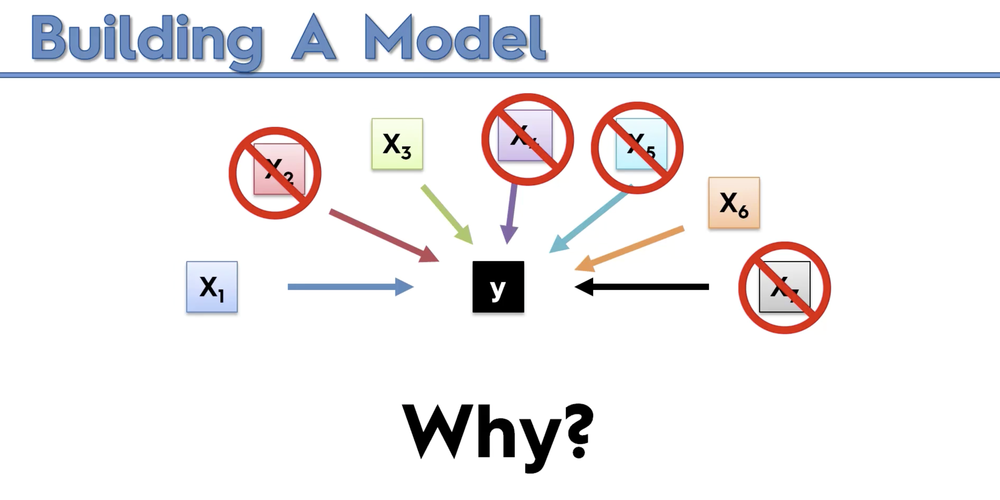

In [61]:
Image(filename='model1.png')

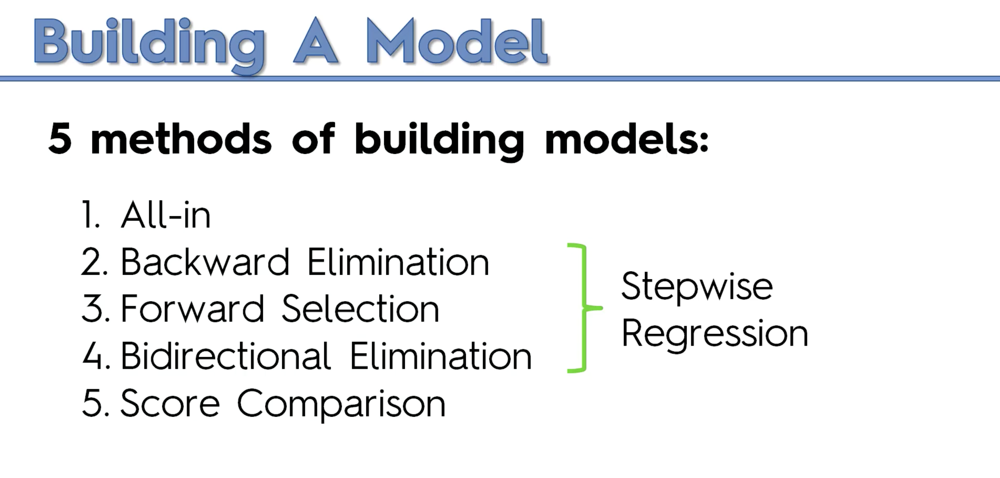

In [62]:
Image(filename='model2.png')

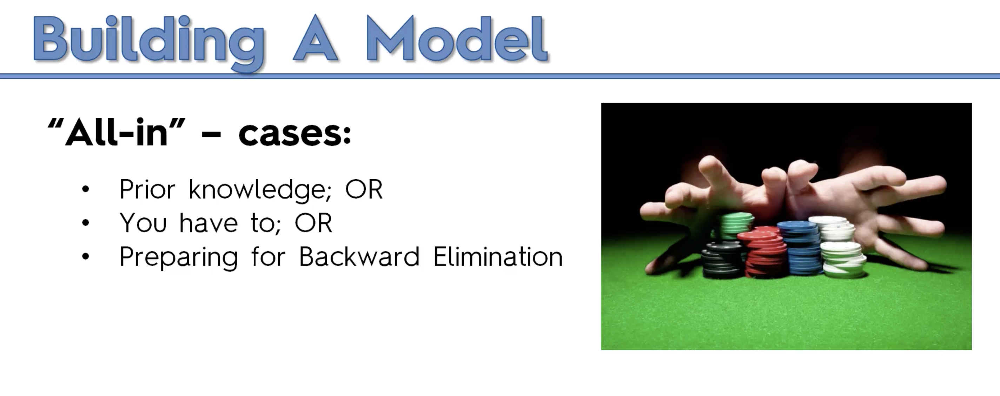

In [63]:
Image(filename='model3.png')

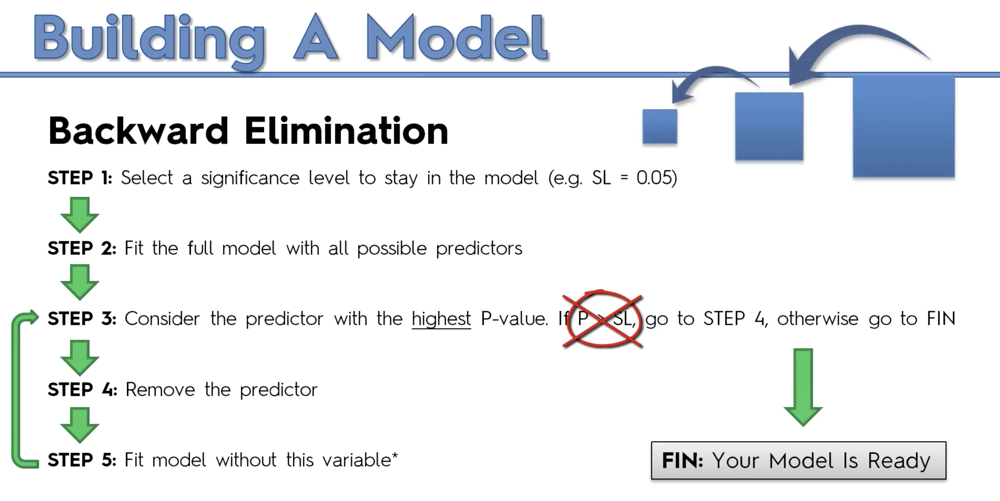

In [64]:
Image(filename='model4.png')

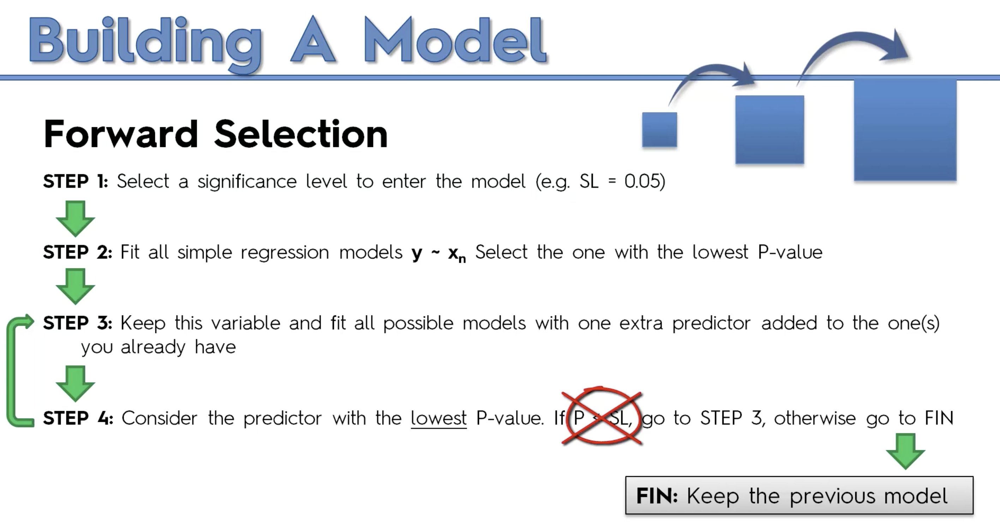

In [65]:
Image(filename='model5.png')

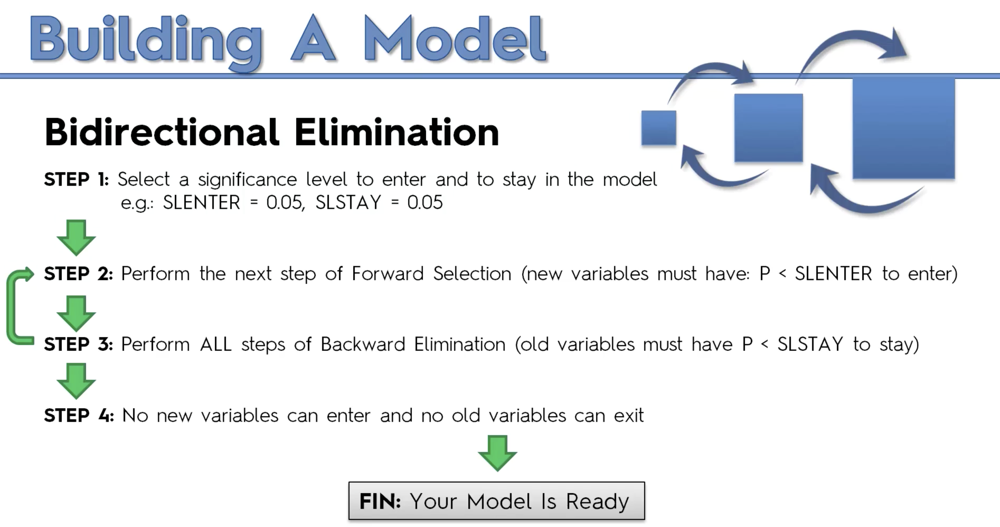

In [66]:
Image(filename='model6.png')

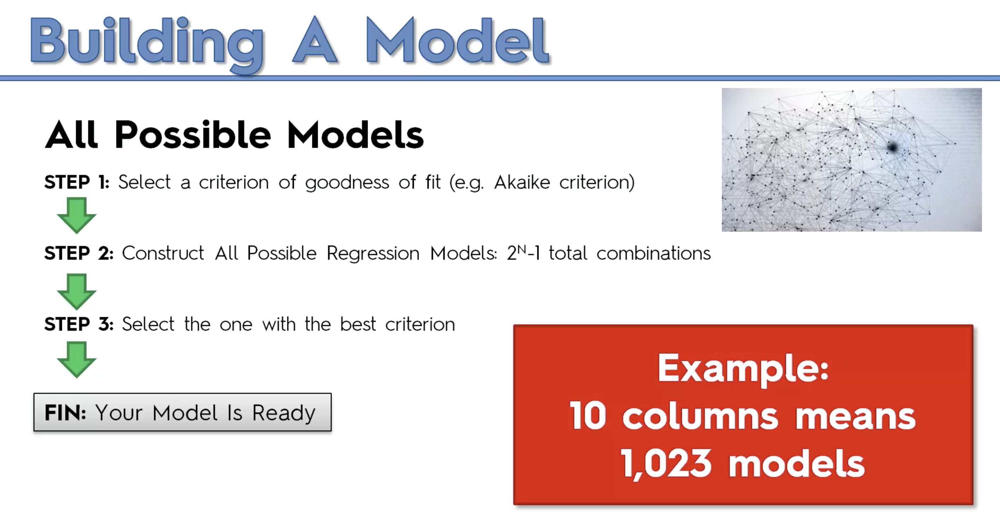

In [67]:
Image(filename='model7.png')

## Importing statsmodels library

In [68]:
import statsmodels.api as sm

## Add a column formed by 1 to X

In [69]:
X = np.append(arr = np.ones((50,1)), values= X, axis=1)

In [70]:
X.shape

(50, 6)

In [71]:
X[0:5,:]

array([[1.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.6534920e+05,
        1.3689780e+05, 4.7178410e+05],
       [1.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.6259770e+05,
        1.5137759e+05, 4.4389853e+05],
       [1.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.5344151e+05,
        1.0114555e+05, 4.0793454e+05],
       [1.0000000e+00, 0.0000000e+00, 1.0000000e+00, 1.4437241e+05,
        1.1867185e+05, 3.8319962e+05],
       [1.0000000e+00, 1.0000000e+00, 0.0000000e+00, 1.4210734e+05,
        9.1391770e+04, 3.6616842e+05]])

## Create a new optimal features matrix

In [72]:
X_opt = X[:,[0,1,2,3,4,5]]

## Regressor OLS (Ordinary Least Squares) and summary

In [73]:
regressor_OLS = sm.OLS(endog=y,exog=X_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     169.9
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           1.34e-27
Time:                        13:33:33   Log-Likelihood:                -525.38
No. Observations:                  50   AIC:                             1063.
Df Residuals:                      44   BIC:                             1074.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.013e+04   6884.820      7.281      0.000    3.62e+04     6.4e+04
x1           198.7888   3371.007      0.059      0.953   -6595.030    6992.607
x2           -41.8870   3256.039     -0.013      0.990   -6604.003    6520.229
x3             0.8060      0.046     17.369      0.000       0.712       0.900
x4            -0.0270      0.052     -0.517      0.608      -0.132       0.078
x5             0.0270      0.017      1.574      0.123      -0.008       0.062
==============================================================================
Omnibus:                       14.782   Durbin-Watson:                   1.283
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               21.266
Skew:                          -0.948   Prob(JB):                     2.41e-05
Kurtosis:                       5.572   Cond. No.                     1.45e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.45e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [74]:
X_opt = X[:,[0,1,3,4,5]]
regressor_OLS = sm.OLS(endog=y,exog=X_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     217.2
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           8.49e-29
Time:                        13:33:33   Log-Likelihood:                -525.38
No. Observations:                  50   AIC:                             1061.
Df Residuals:                      45   BIC:                             1070.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.011e+04   6647.870      7.537      0.000    3.67e+04    6.35e+04
x1           220.1585   2900.536      0.076      0.940   -5621.821    6062.138
x2             0.8060      0.046     17.606      0.000       0.714       0.898
x3            -0.0270      0.052     -0.523      0.604      -0.131       0.077
x4             0.0270      0.017      1.592      0.118      -0.007       0.061
==============================================================================
Omnibus:                       14.758   Durbin-Watson:                   1.282
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               21.172
Skew:                          -0.948   Prob(JB):                     2.53e-05
Kurtosis:                       5.563   Cond. No.                     1.40e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.4e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [75]:
X_opt = X[:,[0,3,4,5]]
regressor_OLS = sm.OLS(endog=y,exog=X_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     296.0
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           4.53e-30
Time:                        13:33:33   Log-Likelihood:                -525.39
No. Observations:                  50   AIC:                             1059.
Df Residuals:                      46   BIC:                             1066.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.012e+04   6572.353      7.626      0.000    3.69e+04    6.34e+04
x1             0.8057      0.045     17.846      0.000       0.715       0.897
x2            -0.0268      0.051     -0.526      0.602      -0.130       0.076
x3             0.0272      0.016      1.655      0.105      -0.006       0.060
==============================================================================
Omnibus:                       14.838   Durbin-Watson:                   1.282
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               21.442
Skew:                          -0.949   Prob(JB):                     2.21e-05
Kurtosis:                       5.586   Cond. No.                     1.40e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.4e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [76]:
X_opt = X[:,[0,3,5]]
regressor_OLS = sm.OLS(endog=y,exog=X_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     450.8
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           2.16e-31
Time:                        13:33:33   Log-Likelihood:                -525.54
No. Observations:                  50   AIC:                             1057.
Df Residuals:                      47   BIC:                             1063.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.698e+04   2689.933     17.464      0.000    4.16e+04    5.24e+04
x1             0.7966      0.041     19.266      0.000       0.713       0.880
x2             0.0299      0.016      1.927      0.060      -0.001       0.061
==============================================================================
Omnibus:                       14.677   Durbin-Watson:                   1.257
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               21.161
Skew:                          -0.939   Prob(JB):                     2.54e-05
Kurtosis:                       5.575   Cond. No.                     5.32e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.32e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [77]:
X_opt = X[:,[0,3]]
regressor_OLS = sm.OLS(endog=y,exog=X_opt).fit()
regressor_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     849.8
Date:                Sat, 05 Apr 2025   Prob (F-statistic):           3.50e-32
Time:                        13:33:33   Log-Likelihood:                -527.44
No. Observations:                  50   AIC:                             1059.
Df Residuals:                      48   BIC:                             1063.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.903e+04   2537.897     19.320      0.000    4.39e+04    5.41e+04
x1             0.8543      0.029     29.151      0.000       0.795       0.913
==============================================================================
Omnibus:                       13.727   Durbin-Watson:                   1.116
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               18.536
Skew:                          -0.911   Prob(JB):                     9.44e-05
Kurtosis:                       5.361   Cond. No.                     1.65e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.65e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

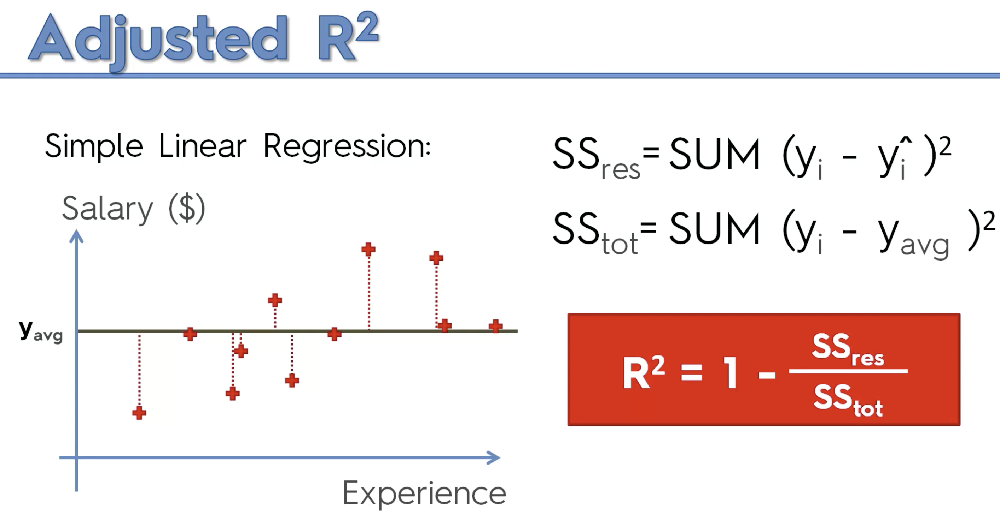

In [78]:
Image(filename='AdjRSq1.png')

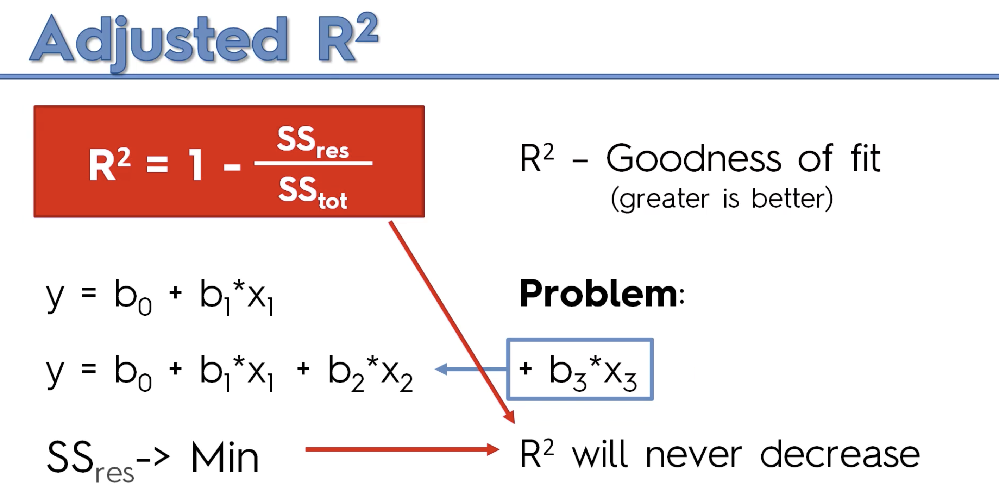

In [79]:
Image(filename='AdjRSq2.png')

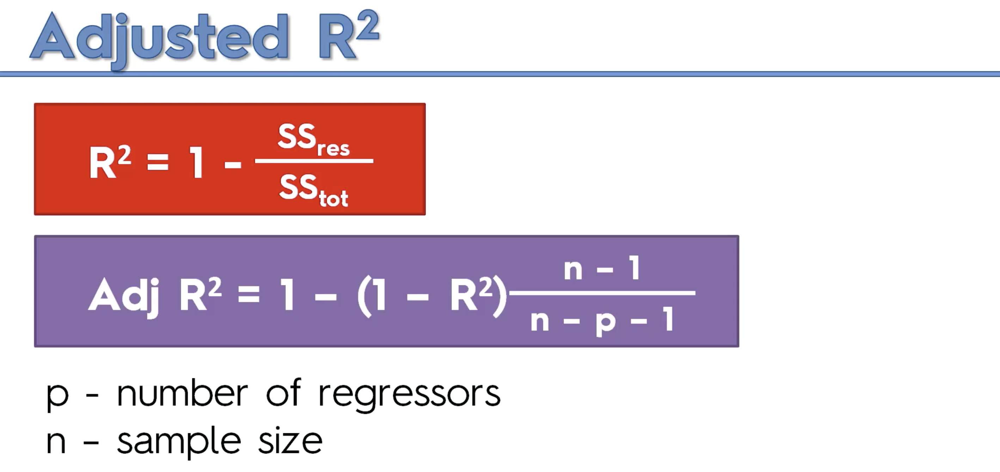

In [80]:
Image(filename='AdjRSq3.png')

### Lasso Regression

In [81]:
from sklearn import linear_model
lasso = linear_model.Lasso(alpha=0.9)
lasso.fit(X_train, y_train)
print(lasso.intercept_)
print(lasso.coef_)

42555.89883537807
[-9.55417125e+02  6.96589609e+02  7.73488699e-01  3.28706086e-02
  3.66024060e-02]


In [82]:
y_pred_r = lasso.predict(X_test)

In [83]:
for i in range(10):
    print([y_test[i],y_pred_r[i]])

[103282.38, 103018.76509724112]
[144259.4, 132582.986861258]
[146121.95, 132452.23523513734]
[77798.83, 71979.85838633508]
[191050.39, 178541.85714051174]
[105008.31, 116157.26495880482]
[81229.06, 67848.74470209527]
[97483.56, 98789.19200258289]
[110352.25, 113972.59609835342]
[166187.94, 167925.65156354255]


In [84]:
print(f'MSE = {mean_squared_error(y_test, y_pred_r)}')
print(f'RMSE = {rmse(y_test, y_pred_r)}')
print(f'MAE = {mean_absolute_error(y_test, y_pred_r)}')
print(f'R2 = {r2_score(y_test,y_pred_r)}')

MSE = 83475629.97146869
RMSE = 9136.499875306117
MAE = 7513.020720070516
R2 = 0.9347281423787829
